[array([[ 0.0375,  0.025 ],
       [-0.0375,  0.025 ],
       [-0.0375, -0.025 ],
       [ 0.0375, -0.025 ]], dtype=float32)]
[array([[ 0.017    , -0.0198141],
       [ 0.017001 , -0.0197705],
       [ 0.0170038, -0.0197269],
       ...,
       [-0.017    , -0.0198141],
       [-0.017    , -0.0224915],
       [ 0.017    , -0.0224915]], dtype=float32), array([[-0.00318724,  0.0153104 ],
       [-0.00327431,  0.0153161 ],
       [-0.00336105,  0.0153256 ],
       [-0.0034473 ,  0.0153389 ],
       [-0.00353288,  0.0153559 ],
       [-0.00361764,  0.0153766 ],
       [-0.00370141,  0.0154011 ],
       [-0.00378404,  0.0154291 ],
       [-0.00386537,  0.0154607 ],
       [-0.00394524,  0.0154959 ],
       [-0.0040235 ,  0.0155345 ],
       [-0.0041    ,  0.0155764 ],
       [-0.0041746 ,  0.0156217 ],
       [-0.00424715,  0.0156702 ],
       [-0.00431752,  0.0157218 ],
       [-0.00438558,  0.0157764 ],
       [-0.00445118,  0.0158339 ],
       [-0.00451421,  0.0158943 ],
       [-0.00457

[[array([[ 0.03789018, -0.02696157],
         [ 0.03826537, -0.02684776],
         [ 0.03861114, -0.02666294],
         [ 0.03891421, -0.02641421],
         [ 0.03916294, -0.02611114],
         [ 0.03934776, -0.02576537],
         [ 0.03946157, -0.02539018],
         [ 0.0395    , -0.025     ],
         [ 0.0395    ,  0.025     ],
         [ 0.03946157,  0.02539018],
         [ 0.03934776,  0.02576537],
         [ 0.03916294,  0.02611114],
         [ 0.03891421,  0.02641421],
         [ 0.03861114,  0.02666294],
         [ 0.03826537,  0.02684776],
         [ 0.03789018,  0.02696157],
         [ 0.0375    ,  0.027     ],
         [-0.0375    ,  0.027     ],
         [-0.03789018,  0.02696157],
         [-0.03826537,  0.02684776],
         [-0.03861114,  0.02666294],
         [-0.03891421,  0.02641421],
         [-0.03916294,  0.02611114],
         [-0.03934776,  0.02576537],
         [-0.03946157,  0.02539018],
         [-0.0395    ,  0.025     ],
         [-0.0395    , -0.025     ],
 

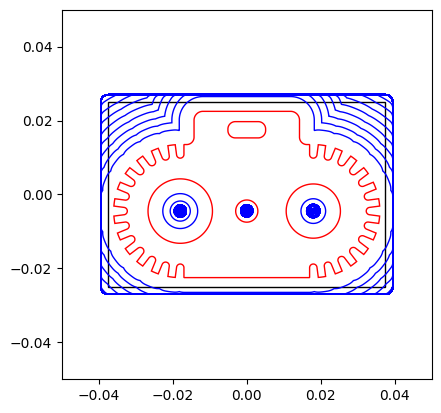

In [60]:
import numpy as np
import meshlib.mrmeshpy as mm
import meshlib.mrmeshnumpy as mn
import polyscope as ps
import math
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from manifold3d import Manifold, set_circular_segments, CrossSection, Mesh, FillRule, JoinType
set_circular_segments(32)

def loadobj(filename):
    model = mm.loadMesh(filename)
    model.transform(mm.AffineXf3f.translation(-model.getBoundingBox().center()))
    mesh = Mesh(vert_properties = mn.getNumpyVerts(model), tri_verts = mn.getNumpyFaces(model.topology))   
    return Manifold(mesh)

class Tool:
    def __init__(self, type, diameter, length=50e-3):
        self.type = type
        self.diameter = diameter
        self.length = length
    
    def generate_bit(self, loc):
        if self.type == "endmill":
            return Manifold.cylinder(self.length, self.diameter/2).translate(loc)
        elif self.type == "ballnose":
            shaft = Manifold.cylinder(self.length-self.diameter/2, self.diameter/2)
            bit = Manifold.sphere(self.diameter/2)
            return (shaft + bit).translate([0,0,self.diameter/2]).translate(loc)
        elif self.type == "drill":
            conelen = 0.5*self.diameter/math.tan(math.radians(59))
            shaft = Manifold.cylinder(self.length-conelen, self.diameter/2)
            bit = Manifold.cylinder(conelen, self.diameter/2, 0).rotate(np.array([180, 0, 0])).translate(conelen)
            return (shaft + bit).translate(loc)
        
    def generate_linear_cutarea(self, loc1, loc2):
        delta = loc2 - loc1
        dcyl = 0 if self.type == "endmill" else (0.5*self.diameter if self.type == "ballnose" else 0.5*self.diameter/math.tan(math.radians(59)))
        
        dxy = (delta[0]**2 + delta[1]**2)**0.5
        dxyz = (delta[0]**2 + delta[1]**2 + delta[2]**2)**0.5
        phi = math.atan2(delta[0], delta[1])+np.pi
        theta = math.atan2(dxy, delta[2])

        cutarea = Manifold()
        if dxy > 1e-9:
            rectrod = CrossSection.square([self.diameter, (self.length-dcyl)*np.sin(theta)]).translate([-0.5*self.diameter, 0])
            cutarea += Manifold.extrude(rectrod, dxyz)\
                .warp(lambda v: [v[0], v[1], v[2]+v[1]/math.tan(theta)])\
                .rotate(np.array([np.rad2deg(theta), 0, 0]))\
                .translate([0,0,dcyl])
        if abs(delta[2]) > 1e-9:
            circ = CrossSection.circle(0.5*self.diameter)
            cutarea += Manifold.extrude(circ, 1).scale([1,1,delta[2]])\
                .warp(lambda v: [v[0], v[1]-v[2]*math.tan(theta), v[2]])\
                .translate([0,0,dcyl])
        cutarea += Manifold.cylinder(self.length-dcyl, 0.5*self.diameter).rotate([0, 0, np.degrees(phi)]).translate([0,0,dcyl])
        cutarea += Manifold.cylinder(self.length-dcyl, 0.5*self.diameter).rotate([0, 0, np.degrees(phi)]).translate([0,-dxy,delta[2]+dcyl])
        if self.type == "ballnose":
            circ = CrossSection.circle(0.5*self.diameter)
            cutarea += Manifold.extrude(circ, dxyz)\
                .rotate(np.array([np.rad2deg(theta), 0, 0]))\
                .translate([0,0,dcyl])
            if dxy > 1e-9:
                cutarea += Manifold.revolve(circ, circular_segments=int(16*(np.pi-theta)/np.pi)+1, revolve_degrees=np.degrees(np.pi-theta))\
                    .rotate(np.array([-90, 0., 90]))\
                    .translate([0,0,dcyl])
                cutarea += Manifold.revolve(circ, circular_segments=int(16*(theta)/np.pi)+1, revolve_degrees=np.degrees(theta))\
                    .rotate(np.array([-90, 0., -90]))\
                    .translate([0,-dxy,dcyl+delta[2]])
            else:
                cutarea += Manifold.sphere(0.5*self.diameter).translate([0,0,dcyl])

        cutarea = cutarea.rotate(np.array([0, 0, -np.rad2deg(phi)])).translate(loc1)

        return cutarea

    def __str__(self):
        return f"{self.diameter:.1f} mm {self.type}"

model_file = 'ledmain.obj'
blank_size = np.array([75e-3, 25e-3, 50e-3])
model = loadobj(model_file).rotate([90,0,0])
material = Manifold.cube(blank_size, True).rotate([90,0,0])
tool = Tool("endmill", 4e-3)

ps.init()
ps.set_up_dir("z_up")
ps.set_front_dir("neg_y_front")
ps.set_ground_plane_mode("none")
ps.set_transparency_mode("pretty")
ps.register_surface_mesh("model", model.to_mesh().vert_properties[:, :3], model.to_mesh().tri_verts)
ps.register_surface_mesh("diff", material.to_mesh().vert_properties[:, :3], material.to_mesh().tri_verts).set_transparency(0.5)

bounds = material.trim_by_plane([0,0,1], 0e-3).trim_by_plane([0,0,-1], -5e-3).project()
print(bounds.to_polygons())
cut = model.trim_by_plane([0,0,1], 0e-3).trim_by_plane([0,0,-1], -5e-3).project() ^ bounds
print(cut.to_polygons())

fig, ax = plt.subplots()
ax.add_patch(Polygon(bounds.to_polygons()[0], facecolor='none', edgecolor='black'))
for poly in cut.to_polygons():
    ax.add_patch(Polygon(poly, facecolor='none', edgecolor='red'))
ax.set_aspect('equal', 'box')
ax.set_xlim(-0.05, 0.05)
ax.set_ylim(-0.05, 0.05)

paths = cut.offset(2e-3, JoinType.Round).simplify() if not cut.is_empty() else (CrossSection.circle(0.4*tool.diameter).to_polygons() ^ bounds)
path_stacks = [[poly] for poly in paths.to_polygons()]
while not (bounds - paths).is_empty():
    paths = (paths ^ bounds).offset(2e-3, JoinType.Round).simplify()
    # add to ax
    for i, poly in enumerate(paths.to_polygons()):
        path_stacks[i].insert(0, poly)

    for poly in paths.to_polygons():
        ax.add_patch(Polygon(poly, facecolor='none', edgecolor='blue'))

path_stacks

In [21]:
arr = [[ 0.03789018, -0.01446157],
       [ 0.03826537, -0.01434776],
       [ 0.03861114, -0.01416294],
       [ 0.03891421, -0.01391421],
       [ 0.03916294, -0.01361114],
       [ 0.03934776, -0.01326537],
       [ 0.03946157, -0.01289018],
       [ 0.0395    , -0.0125    ],
       [ 0.0395    ,  0.00972747],
       [ 0.03946157,  0.01011765],
       [ 0.03934776,  0.01049284],
       [ 0.03920817,  0.01076774],
       [ 0.03920641,  0.01077063],
       [ 0.03920324,  0.01077581],
       [ 0.03917753,  0.01081774],
       [ 0.03917452,  0.01082263],
       [ 0.03916825,  0.01083279],
       [ 0.03916499,  0.01083806],
       [ 0.03915199,  0.01085898],
       [ 0.0391489 ,  0.01086393],
       [ 0.03914217,  0.01087469],
       [ 0.03913853,  0.0108805 ],
       [ 0.03892949,  0.01121218],
       [ 0.038926  ,  0.0112177 ],
       [ 0.03891929,  0.01122827],
       [ 0.03891607,  0.01123332],
       [ 0.03890274,  0.01125418],
       [ 0.03889944,  0.01125933],
       [ 0.03889282,  0.01126962],
       [ 0.0388895 ,  0.01127476],
       [ 0.03886279,  0.011316  ],
       [ 0.03885928,  0.0113214 ],
       [ 0.03885249,  0.01133181],
       [ 0.03884921,  0.01133682],
       [ 0.03883583,  0.0113572 ],
       [ 0.03883241,  0.01136239],
       [ 0.03882582,  0.01137236],
       [ 0.03882265,  0.01137714],
       [ 0.03876827,  0.0114589 ],
       [ 0.03876509,  0.01146367],
       [ 0.03875821,  0.01147395],
       [ 0.03875451,  0.01147946],
       [ 0.03874086,  0.01149971],
       [ 0.03873704,  0.01150535],
       [ 0.03873027,  0.01151532],
       [ 0.03872732,  0.01151965],
       [ 0.03869965,  0.01156017],
       [ 0.03869648,  0.0115648 ],
       [ 0.03868972,  0.01157464],
       [ 0.03868613,  0.01157985],
       [ 0.03867211,  0.01160012],
       [ 0.03866872,  0.01160501],
       [ 0.03866146,  0.01161544],
       [ 0.03865759,  0.01162098],
       [ 0.03854491,  0.0117817 ],
       [ 0.0385414 ,  0.01178669],
       [ 0.03853404,  0.01179712],
       [ 0.03853019,  0.01180256],
       [ 0.03851592,  0.01182264],
       [ 0.03851176,  0.01182847],
       [ 0.03850485,  0.01183812],
       [ 0.0385021 ,  0.01184194],
       [ 0.03847343,  0.01188178],
       [ 0.03847051,  0.01188583],
       [ 0.0384635 ,  0.01189552],
       [ 0.03845941,  0.01190116],
       [ 0.03844501,  0.01192092],
       [ 0.03844107,  0.0119263 ],
       [ 0.03843368,  0.01193637],
       [ 0.03843023,  0.01194106],
       [ 0.03837193,  0.01202002],
       [ 0.03836874,  0.01202433],
       [ 0.03836156,  0.012034  ],
       [ 0.03835757,  0.01203936],
       [ 0.03834293,  0.01205894],
       [ 0.03833903,  0.01206414],
       [ 0.03833157,  0.01207405],
       [ 0.03832801,  0.01207876],
       [ 0.03829838,  0.01211788],
       [ 0.03829486,  0.01212251],
       [ 0.0382874 ,  0.0121323 ],
       [ 0.03828346,  0.01213746],
       [ 0.03826847,  0.012157  ],
       [ 0.03826451,  0.01216214],
       [ 0.03825698,  0.01217189],
       [ 0.03825341,  0.0121765 ],
       [ 0.03801286,  0.0124861 ],
       [ 0.03800932,  0.01249064],
       [ 0.03800159,  0.01250053],
       [ 0.0379974 ,  0.01250588],
       [ 0.03798228,  0.01252509],
       [ 0.03797783,  0.01253072],
       [ 0.03797044,  0.01254004],
       [ 0.0379675 ,  0.01254373],
       [ 0.03793696,  0.01258206],
       [ 0.03793384,  0.01258597],
       [ 0.03792644,  0.01259521],
       [ 0.03792216,  0.01260054],
       [ 0.03790674,  0.01261966],
       [ 0.03790274,  0.0126246 ],
       [ 0.03789472,  0.01263448],
       [ 0.0378907 ,  0.01263942],
       [ 0.03782858,  0.01271545],
       [ 0.03782448,  0.01272045],
       [ 0.03781642,  0.01273025],
       [ 0.03781246,  0.01273505],
       [ 0.03779685,  0.01275391],
       [ 0.03779257,  0.01275906],
       [ 0.03778502,  0.01276812],
       [ 0.03778175,  0.01277203],
       [ 0.03775017,  0.01280973],
       [ 0.0377474 ,  0.01281304],
       [ 0.03773987,  0.01282199],
       [ 0.03773511,  0.01282763],
       [ 0.03771914,  0.01284647],
       [ 0.03771483,  0.01285153],
       [ 0.03770639,  0.01286142],
       [ 0.03770226,  0.01286625],
       [ 0.03757437,  0.01301515],
       [ 0.03756967,  0.0130206 ],
       [ 0.0375612 ,  0.01303039],
       [ 0.03755743,  0.01303473],
       [ 0.03754107,  0.01305353],
       [ 0.03753698,  0.01305822],
       [ 0.03752909,  0.01306723],
       [ 0.03752529,  0.01307155],
       [ 0.03749278,  0.01310846],
       [ 0.03748891,  0.01311284],
       [ 0.03748075,  0.01312205],
       [ 0.03747646,  0.01312688],
       [ 0.03746031,  0.01314499],
       [ 0.03745588,  0.01314994],
       [ 0.03744789,  0.01315884],
       [ 0.03744433,  0.01316279],
       [ 0.03737856,  0.01323566],
       [ 0.03737452,  0.01324013],
       [ 0.03736662,  0.01324883],
       [ 0.03736276,  0.01325306],
       [ 0.03734633,  0.01327105],
       [ 0.03734273,  0.01327499],
       [ 0.0373342 ,  0.01328428],
       [ 0.03732927,  0.01328963],
       [ 0.03729601,  0.01332559],
       [ 0.03729157,  0.01333038],
       [ 0.03728307,  0.01333951],
       [ 0.03727901,  0.01334385],
       [ 0.03726218,  0.01336182],
       [ 0.037258  ,  0.01336627],
       [ 0.03724967,  0.01337511],
       [ 0.03724552,  0.0133795 ],
       [ 0.03697578,  0.01366403],
       [ 0.03697374,  0.01366618],
       [ 0.03697142,  0.01366863],
       [ 0.03696637,  0.01367394],
       [ 0.0369646 ,  0.0136758 ],
       [ 0.03696173,  0.01367881],
       [ 0.03696063,  0.01367996],
       [ 0.03695108,  0.01368996],
       [ 0.0369485 ,  0.01369266],
       [ 0.03694526,  0.01369604],
       [ 0.0369446 ,  0.01369672],
       [ 0.0369401 ,  0.01370141],
       [ 0.03693841,  0.01370317],
       [ 0.03693715,  0.01370448],
       [ 0.03691898,  0.01372338],
       [ 0.03691858,  0.0137238 ],
       [ 0.03691522,  0.0137273 ],
       [ 0.03691042,  0.01373228],
       [ 0.03690824,  0.01373454],
       [ 0.03690532,  0.01373756],
       [ 0.03690458,  0.01373832],
       [ 0.03689553,  0.01374767],
       [ 0.03689349,  0.01374978],
       [ 0.03689017,  0.0137532 ],
       [ 0.03688889,  0.01375451],
       [ 0.03688464,  0.01375888],
       [ 0.03688006,  0.01376358],
       [ 0.03687913,  0.01376453],
       [ 0.03684766,  0.01379683],
       [ 0.03684406,  0.01380056],
       [ 0.03683979,  0.01380494],
       [ 0.03683772,  0.01380706],
       [ 0.0368342 ,  0.01381066],
       [ 0.03683275,  0.01381214],
       [ 0.03682353,  0.01382155],
       [ 0.0368206 ,  0.01382454],
       [ 0.03681754,  0.01382765],
       [ 0.03681741,  0.01382777],
       [ 0.03681246,  0.0138328 ],
       [ 0.03681226,  0.013833  ],
       [ 0.03681037,  0.01383492],
       [ 0.03680868,  0.01383664],
       [ 0.03679006,  0.01385551],
       [ 0.03678921,  0.01385638],
       [ 0.03678839,  0.01385721],
       [ 0.03678842,  0.01385717],
       [ 0.03678352,  0.01386213],
       [ 0.03678353,  0.01386212],
       [ 0.03677945,  0.01386625],
       [ 0.03677536,  0.01387039],
       [ 0.03676596,  0.01387985],
       [ 0.03675245,  0.01389336],
       [ 0.03675122,  0.0138946 ],
       [ 0.03674549,  0.01390032],
       [ 0.03674099,  0.0139048 ],
       [ 0.03672859,  0.0139171 ],
       [ 0.03672436,  0.01392127],
       [ 0.03672149,  0.0139241 ],
       [ 0.03641668,  0.0141707 ],
       [ 0.03606962,  0.01435308],
       [ 0.03569365,  0.01446426],
       [ 0.03531724,  0.0145    ],
       [-0.03531262,  0.0145    ],
       [-0.0357028 ,  0.01446157],
       [-0.03607799,  0.01434776],
       [-0.03642376,  0.01416294],
       [-0.03672683,  0.01391421],
       [-0.03673105,  0.01390999],
       [-0.03698502,  0.0136545 ],
       [-0.03698921,  0.01365027],
       [-0.03699755,  0.01364183],
       [-0.03700171,  0.0136376 ],
       [-0.03701892,  0.01362008],
       [-0.0370228 ,  0.01361612],
       [-0.03703167,  0.01360704],
       [-0.03703666,  0.01360192],
       [-0.03707083,  0.01356669],
       [-0.03707512,  0.01356225],
       [-0.03708394,  0.0135531 ],
       [-0.03708847,  0.01354839],
       [-0.03710543,  0.01353068],
       [-0.03711028,  0.01352559],
       [-0.03711842,  0.01351703],
       [-0.03712171,  0.01351356],
       [-0.03718915,  0.0134423 ],
       [-0.03719299,  0.01343824],
       [-0.03720146,  0.01342924],
       [-0.03720609,  0.0134243 ],
       [-0.03722285,  0.01340637],
       [-0.03722753,  0.01340134],
       [-0.03723582,  0.01339241],
       [-0.03723943,  0.01338851],
       [-0.0372727 ,  0.01335248],
       [-0.03727689,  0.01334794],
       [-0.03728514,  0.01333895],
       [-0.0372892 ,  0.0133345 ],
       [-0.03730571,  0.0133164 ],
       [-0.03730974,  0.01331198],
       [-0.037318  ,  0.01330287],
       [-0.03732223,  0.01329818],
       [-0.03745358,  0.01315239],
       [-0.0374567 ,  0.01314893],
       [-0.03746469,  0.01314002],
       [-0.03746956,  0.01313457],
       [-0.03748577,  0.01311636],
       [-0.03749045,  0.01311108],
       [-0.03749867,  0.01310178],
       [-0.03750221,  0.01309776],
       [-0.03753457,  0.01306095],
       [-0.03753874,  0.01305619],
       [-0.03754682,  0.01304694],
       [-0.03755073,  0.01304245],
       [-0.03756688,  0.01302385],
       [-0.03757076,  0.01301938],
       [-0.03757883,  0.01301003],
       [-0.03758302,  0.01300515],
       [-0.03764693,  0.01293062],
       [-0.03765019,  0.01292681],
       [-0.03765786,  0.01291782],
       [-0.03766227,  0.01291264],
       [-0.03767814,  0.01289391],
       [-0.03768222,  0.01288908],
       [-0.03769042,  0.01287934],
       [-0.03769454,  0.01287443],
       [-0.03772609,  0.01283671],
       [-0.03773023,  0.01283174],
       [-0.03773834,  0.01282198],
       [-0.03774231,  0.01281719],
       [-0.03775799,  0.0127982 ],
       [-0.03776219,  0.01279309],
       [-0.03776976,  0.01278386],
       [-0.03777313,  0.01277974],
       [-0.03802095,  0.01247593],
       [-0.03802452,  0.01247154],
       [-0.03803233,  0.01246191],
       [-0.03803657,  0.01245667],
       [-0.03805197,  0.01243755],
       [-0.03805627,  0.01243219],
       [-0.03806386,  0.0124227 ],
       [-0.03806715,  0.01241857],
       [-0.03809772,  0.01238014],
       [-0.03810116,  0.01237581],
       [-0.03810869,  0.01236629],
       [-0.03811278,  0.0123611 ],
       [-0.03812795,  0.01234179],
       [-0.03813194,  0.01233669],
       [-0.03813958,  0.0123269 ],
       [-0.03814323,  0.01232221],
       [-0.03820341,  0.01224462],
       [-0.03820699,  0.01223999],
       [-0.03821463,  0.01223008],
       [-0.03821869,  0.0122248 ],
       [-0.03823362,  0.0122053 ],
       [-0.03823782,  0.01219979],
       [-0.03824511,  0.0121902 ],
       [-0.0382482 ,  0.01218612],
       [-0.03827781,  0.01214696],
       [-0.03828093,  0.01214283],
       [-0.03828818,  0.01213319],
       [-0.03829231,  0.01212768],
       [-0.03830699,  0.01210802],
       [-0.03831097,  0.01210267],
       [-0.0383184 ,  0.01209265],
       [-0.03832185,  0.01208798],
       [-0.0384383 ,  0.01192998],
       [-0.03844198,  0.01192496],
       [-0.03844909,  0.01191525],
       [-0.03845252,  0.01191056],
       [-0.03846693,  0.01189076],
       [-0.03847023,  0.01188621],
       [-0.03847753,  0.01187612],
       [-0.03848153,  0.01187058],
       [-0.03851019,  0.01183068],
       [-0.03851404,  0.0118253 ],
       [-0.03852123,  0.01181522],
       [-0.03852457,  0.01181052],
       [-0.03853882,  0.01179042],
       [-0.03854218,  0.01178567],
       [-0.03854924,  0.01177565],
       [-0.03855294,  0.01177038],
       [-0.03860921,  0.01168997],
       [-0.03861271,  0.01168495],
       [-0.03862001,  0.01167445],
       [-0.03862381,  0.01166897],
       [-0.03863783,  0.01164866],
       [-0.0386419 ,  0.01164274],
       [-0.03864862,  0.01163293],
       [-0.03865127,  0.01162904],
       [-0.03867888,  0.01158853],
       [-0.03868212,  0.01158377],
       [-0.03868888,  0.01157379],
       [-0.0386924 ,  0.01156857],
       [-0.03870599,  0.01154837],
       [-0.03870943,  0.01154325],
       [-0.03871626,  0.01153303],
       [-0.03871965,  0.01152793],
       [-0.0389365 ,  0.01120129],
       [-0.03893933,  0.01119702],
       [-0.03894613,  0.01118672],
       [-0.0389501 ,  0.01118069],
       [-0.0389636 ,  0.01116008],
       [-0.03896756,  0.01115401],
       [-0.03897426,  0.0111437 ],
       [-0.038977  ,  0.01113946],
       [-0.03900362,  0.01109827],
       [-0.03900634,  0.01109405],
       [-0.03901305,  0.01108361],
       [-0.03901704,  0.01107739],
       [-0.03903016,  0.01105681],
       [-0.03903425,  0.01105036],
       [-0.03904066,  0.01104022],
       [-0.03904298,  0.01103653],
       [-0.03909524,  0.01095346],
       [-0.0390978 ,  0.01094939],
       [-0.03910402,  0.01093945],
       [-0.03910768,  0.01093358],
       [-0.03912054,  0.01091287],
       [-0.03912391,  0.01090743],
       [-0.03913055,  0.01089666],
       [-0.03913382,  0.01089133],
       [-0.03915946,  0.01084945],
       [-0.03916232,  0.01084476],
       [-0.0391688 ,  0.01083411],
       [-0.03917242,  0.01082815],
       [-0.0391852 ,  0.01080698],
       [-0.03918885,  0.0108009 ],
       [-0.03919515,  0.01079038],
       [-0.03919794,  0.01078571],
       [-0.03921864,  0.01075093],
       [-0.03938517,  0.01039599],
       [-0.03947925,  0.01001537],
       [-0.0395    ,  0.00972805],
       [-0.0395    , -0.0125    ],
       [-0.03946157, -0.01289018],
       [-0.03934776, -0.01326537],
       [-0.03916294, -0.01361114],
       [-0.03891421, -0.01391421],
       [-0.03861114, -0.01416294],
       [-0.03826537, -0.01434776],
       [-0.03789018, -0.01446157],
       [-0.0375    , -0.0145    ],
       [ 0.0375    , -0.0145    ]]

In [34]:
ps = 0
arrs = []
polys = [pt for bound in bounds.offset(2e-3, JoinType.Round).to_polygons() for pt in bound]
for i in range(len(arr)):
    if any((pt[0]-arr[i][0])**2+(pt[1]-arr[i][1])**2 < 1e-9 for pt in polys):
        if i-ps > 1:
            arrs.append(arr[ps:i])
        ps = i+1
arrs

[[[0.0395, 0.00972747],
  [0.03946157, 0.01011765],
  [0.03934776, 0.01049284],
  [0.03920817, 0.01076774],
  [0.03920641, 0.01077063],
  [0.03920324, 0.01077581],
  [0.03917753, 0.01081774],
  [0.03917452, 0.01082263],
  [0.03916825, 0.01083279],
  [0.03916499, 0.01083806],
  [0.03915199, 0.01085898],
  [0.0391489, 0.01086393],
  [0.03914217, 0.01087469],
  [0.03913853, 0.0108805],
  [0.03892949, 0.01121218],
  [0.038926, 0.0112177],
  [0.03891929, 0.01122827],
  [0.03891607, 0.01123332],
  [0.03890274, 0.01125418],
  [0.03889944, 0.01125933],
  [0.03889282, 0.01126962],
  [0.0388895, 0.01127476],
  [0.03886279, 0.011316],
  [0.03885928, 0.0113214],
  [0.03885249, 0.01133181],
  [0.03884921, 0.01133682],
  [0.03883583, 0.0113572],
  [0.03883241, 0.01136239],
  [0.03882582, 0.01137236],
  [0.03882265, 0.01137714],
  [0.03876827, 0.0114589],
  [0.03876509, 0.01146367],
  [0.03875821, 0.01147395],
  [0.03875451, 0.01147946],
  [0.03874086, 0.01149971],
  [0.03873704, 0.01150535],
  [0.03

In [35]:
polys

[array([ 0.03789018, -0.01446157], dtype=float32),
 array([ 0.03826537, -0.01434776], dtype=float32),
 array([ 0.03861114, -0.01416294], dtype=float32),
 array([ 0.03891421, -0.01391421], dtype=float32),
 array([ 0.03916294, -0.01361114], dtype=float32),
 array([ 0.03934776, -0.01326537], dtype=float32),
 array([ 0.03946157, -0.01289018], dtype=float32),
 array([ 0.0395, -0.0125], dtype=float32),
 array([0.0395, 0.0125], dtype=float32),
 array([0.03946157, 0.01289018], dtype=float32),
 array([0.03934776, 0.01326537], dtype=float32),
 array([0.03916294, 0.01361114], dtype=float32),
 array([0.03891421, 0.01391421], dtype=float32),
 array([0.03861114, 0.01416294], dtype=float32),
 array([0.03826537, 0.01434776], dtype=float32),
 array([0.03789018, 0.01446157], dtype=float32),
 array([0.0375, 0.0145], dtype=float32),
 array([-0.0375,  0.0145], dtype=float32),
 array([-0.03789018,  0.01446157], dtype=float32),
 array([-0.03826537,  0.01434776], dtype=float32),
 array([-0.03861114,  0.014162

In [62]:
import difflib

a = [1.0, 2.0, 3.0, 4.0]
a = a + a
b = [4.0, 1.0, 3.0, 3.0]
b = b + b
aidx, bidx, size = difflib.SequenceMatcher(None, a, b).find_longest_match()
print(a[aidx:aidx+size])

Match(a=2, b=3, size=3)